In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
import datetime as dt
import matplotlib
import matplotlib.pyplot as plt
import geopandas as gpd
import plotly.express as px

In [2]:
data= pd.read_csv("./Dataset/FastagFraudDetection.csv")

In [3]:
data.head()

,Transaction_ID,Timestamp,Vehicle_Type,FastagID,TollBoothID,Lane_Type,Vehicle_Dimensions,Transaction_Amount,Amount_paid,Geographical_Location,Vehicle_Speed,Vehicle_Plate_Number,Fraud_indicator
0,1,1/6/2023 11:20,Bus,FTG-001-ABC-121,A-101,Express,Large,350,120,"13.059816123454882, 77.77068662374292",65,KA11AB1234,Fraud
1,2,1/7/2023 14:55,Car,FTG-002-XYZ-451,B-102,Regular,Small,120,100,"13.059816123454882, 77.77068662374292",78,KA66CD5678,Fraud
2,3,1/8/2023 18:25,Motorcycle,NaN,D-104,Regular,Small,0,0,"13.059816123454882, 77.77068662374292",53,KA88EF9012,Not Fraud
3,4,1/9/2023 2:05,Truck,FTG-044-LMN-322,C-103,Regular,Large,350,120,"13.059816123454882, 77.77068662374292",92,KA11GH3456,Fraud
4,5,1/10/2023 6:35,Van,FTG-505-DEF-652,B-102,Express,Medium,140,100,"13.059816123454882, 77.77068662374292",60,KA44IJ6789,Fraud


In [4]:
data[['Longitude', 'Latitude']] = data['Geographical_Location'].str.split(',', expand=True)

In [5]:
data = data.drop(['Geographical_Location'], axis = 1)

In [6]:
x = data.drop(['Transaction_ID','FastagID','Vehicle_Plate_Number','Fraud_indicator'], axis = 1)
y = data['Fraud_indicator']

In [7]:
x.shape, y.shape

((5000, 10), (5000,))

In [8]:
x.head()

,Timestamp,Vehicle_Type,TollBoothID,Lane_Type,Vehicle_Dimensions,Transaction_Amount,Amount_paid,Vehicle_Speed,Longitude,Latitude
0,1/6/2023 11:20,Bus,A-101,Express,Large,350,120,65,13.059816123454882,77.77068662374292
1,1/7/2023 14:55,Car,B-102,Regular,Small,120,100,78,13.059816123454882,77.77068662374292
2,1/8/2023 18:25,Motorcycle,D-104,Regular,Small,0,0,53,13.059816123454882,77.77068662374292
3,1/9/2023 2:05,Truck,C-103,Regular,Large,350,120,92,13.059816123454882,77.77068662374292
4,1/10/2023 6:35,Van,B-102,Express,Medium,140,100,60,13.059816123454882,77.77068662374292


In [9]:
df_geo = gpd.GeoDataFrame(x, geometry = gpd.points_from_xy(x.Latitude, x.Longitude))

In [10]:
# get built-in dataset from geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

C:\Users\firas\AppData\Local\Temp\ipykernel_5024\4228630498.py:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


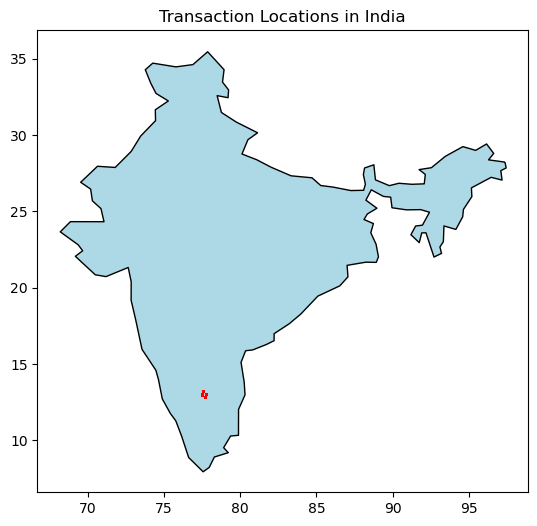

In [11]:
axis = world[world['name'] == 'India'].plot(color = 'lightblue',edgecolor = 'black')
df_geo.plot(ax = axis, color = 'Red', markersize=0.1)
plt.title('Transaction Locations in India')

fig = plt.gcf()
fig.set_size_inches(9,6)
plt.show()

In [12]:
x['Vehicle_Type'].nunique(), x['Vehicle_Type'].unique() # check how many to encode
x = pd.get_dummies(x, columns=['Vehicle_Type', 'TollBoothID', 'Lane_Type', 'Vehicle_Dimensions'])
y = pd.get_dummies(y, columns=['Fraud_indicator'], drop_first = True)

In [13]:
x.head()

,Timestamp,Transaction_Amount,Amount_paid,Vehicle_Speed,Longitude,Latitude,Vehicle_Type_Bus,Vehicle_Type_Car,Vehicle_Type_Motorcycle,Vehicle_Type_SUV,...,TollBoothID_B-102,TollBoothID_C-103,TollBoothID_D-104,TollBoothID_D-105,TollBoothID_D-106,Lane_Type_Express,Lane_Type_Regular,Vehicle_Dimensions_Large,Vehicle_Dimensions_Medium,Vehicle_Dimensions_Small
0,1/6/2023 11:20,350,120,65,13.059816123454882,77.77068662374292,True,False,False,False,...,False,False,False,False,False,True,False,True,False,False
1,1/7/2023 14:55,120,100,78,13.059816123454882,77.77068662374292,False,True,False,False,...,True,False,False,False,False,False,True,False,False,True
2,1/8/2023 18:25,0,0,53,13.059816123454882,77.77068662374292,False,False,True,False,...,False,False,True,False,False,False,True,False,False,True
3,1/9/2023 2:05,350,120,92,13.059816123454882,77.77068662374292,False,False,False,False,...,False,True,False,False,False,False,True,True,False,False
4,1/10/2023 6:35,140,100,60,13.059816123454882,77.77068662374292,False,False,False,False,...,True,False,False,False,False,True,False,False,True,False


In [14]:
x['Timestamp'] = pd.to_datetime(x['Timestamp'])

In [15]:
x['Timestamp'] = x['Timestamp'].map(dt.datetime.toordinal)

In [16]:
x.head()

,Timestamp,Transaction_Amount,Amount_paid,Vehicle_Speed,Longitude,Latitude,Vehicle_Type_Bus,Vehicle_Type_Car,Vehicle_Type_Motorcycle,Vehicle_Type_SUV,...,TollBoothID_B-102,TollBoothID_C-103,TollBoothID_D-104,TollBoothID_D-105,TollBoothID_D-106,Lane_Type_Express,Lane_Type_Regular,Vehicle_Dimensions_Large,Vehicle_Dimensions_Medium,Vehicle_Dimensions_Small
0,738526,350,120,65,13.059816123454882,77.77068662374292,True,False,False,False,...,False,False,False,False,False,True,False,True,False,False
1,738527,120,100,78,13.059816123454882,77.77068662374292,False,True,False,False,...,True,False,False,False,False,False,True,False,False,True
2,738528,0,0,53,13.059816123454882,77.77068662374292,False,False,True,False,...,False,False,True,False,False,False,True,False,False,True
3,738529,350,120,92,13.059816123454882,77.77068662374292,False,False,False,False,...,False,True,False,False,False,False,True,True,False,False
4,738530,140,100,60,13.059816123454882,77.77068662374292,False,False,False,False,...,True,False,False,False,False,True,False,False,True,False


In [17]:
y.head()

,Not Fraud
0,False
1,False
2,True
3,False
4,False


In [18]:
X_train, X_test, y_train, y_test = train_test_split(x, y, train_size=0.8, random_state=0, shuffle=True, stratify=y)

In [19]:
X_train.head()

,Timestamp,Transaction_Amount,Amount_paid,Vehicle_Speed,Longitude,Latitude,Vehicle_Type_Bus,Vehicle_Type_Car,Vehicle_Type_Motorcycle,Vehicle_Type_SUV,...,TollBoothID_B-102,TollBoothID_C-103,TollBoothID_D-104,TollBoothID_D-105,TollBoothID_D-106,Lane_Type_Express,Lane_Type_Regular,Vehicle_Dimensions_Large,Vehicle_Dimensions_Medium,Vehicle_Dimensions_Small
3125,738599,0,0,48,13.042660878688794,77.47580097259879,False,False,True,False,...,False,False,False,False,True,False,True,False,False,True
1505,738521,300,300,63,12.936687032945434,77.53113977439017,True,False,False,False,...,False,True,False,False,False,False,True,True,False,False
3770,738604,340,340,53,12.84197701525119,77.67547528176169,False,False,False,False,...,False,True,False,False,False,True,False,True,False,False
2723,738712,180,180,85,13.059816123454882,77.77068662374292,False,False,False,True,...,True,False,False,False,False,False,True,True,False,False
1188,738746,120,100,54,12.84197701525119,77.67547528176169,False,False,False,False,...,False,False,False,False,False,True,False,False,True,False


In [20]:
##linear regression model

def Linear_regression(x_train,y_train,x_test,y_test):  
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    return pred

LR_predicted = Linear_regression(X_train,y_train,X_test,y_test)         ##calling function

In [21]:
## function to calculate r2_score of predicted values
def r2_score_(actual_value,predicted_value):
    r2=r2_score(actual_value, predicted_value)
    return r2

r2_score_(y_test,LR_predicted)

0.5407355059560729

In [22]:
#grid search cv function

def grid_search(estimator,parameters,x,y):
    grid= GridSearchCV(estimator,param_grid=parameters)
    grid.fit(x,y)
    return grid.best_params_

In [23]:
parameters_decision_tree={
    'criterion':['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'max_depth':[2,4,8,10,None],
    'min_samples_split' : [2,4,8,10,20],
    'max_leaf_nodes' : [4, 8, 10,15,20],
    'splitter':['best','random'],
    'max_features':['auto','sqrt','log2'],
    'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
}

#insert parameters and estimator in grid search function
grid_search(DecisionTreeRegressor(),parameters_decision_tree,X_train,y_train)

c:\Users\firas\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
c:\Users\firas\a

{'criterion': 'squared_error',
 'max_depth': 4,
 'max_features': 'auto',
 'max_leaf_nodes': 8,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [24]:
def Decision_tree_regressor_model(x_train,y_train,x_test,y_test):
    tree=DecisionTreeRegressor(criterion= 'squared_error', max_depth=4, max_features='auto', 
                                max_leaf_nodes= 8, min_samples_split = 2,
                                min_weight_fraction_leaf =  0.1,splitter='best')
    tree.fit(x_train,y_train)
    pred =tree.predict(x_test)
    return pred                           
                               
DT_predicted = Decision_tree_regressor_model(X_train,y_train,X_test,y_test)

c:\Users\firas\anaconda3\Lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(


In [25]:
r2_score_(y_test,DT_predicted)

0.5856555086648637

In [26]:
parameters_random_forest={
    'n_estimators':[50,100],
    'criterion':['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'max_depth':[2,4,8,10,None],
    'min_samples_split' : [2,4,8,10,20],
    'max_leaf_nodes' : [4, 8, 10,15,20],
    'max_features':['sqrt','log2']
}

grid_search(RandomForestRegressor(),parameters_random_forest,X_train,y_train)

c:\Users\firas\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:686: DataConversionWarning: A column-vector y wa

{'criterion': 'friedman_mse',
 'max_depth': 10,
 'max_features': 'log2',
 'max_leaf_nodes': 20,
 'min_samples_split': 20,
 'n_estimators': 50}

In [27]:
def random_forest_regressor(x_train,y_train,x_test,y_test):
    forest=RandomForestRegressor(n_estimators=50,criterion= 'friedman_mse', max_depth=10,
                                 max_features='log2', max_leaf_nodes= 20, 
                                 min_samples_split = 20)
    forest.fit(x_train,y_train)
    pred =forest.predict(x_test)
    return pred 

RF_predicted=random_forest_regressor(X_train,y_train,X_test,y_test)

C:\Users\firas\AppData\Local\Temp\ipykernel_5024\1027737635.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  forest.fit(x_train,y_train)


In [28]:
r2_score_(y_test,RF_predicted)

0.6423444878669413

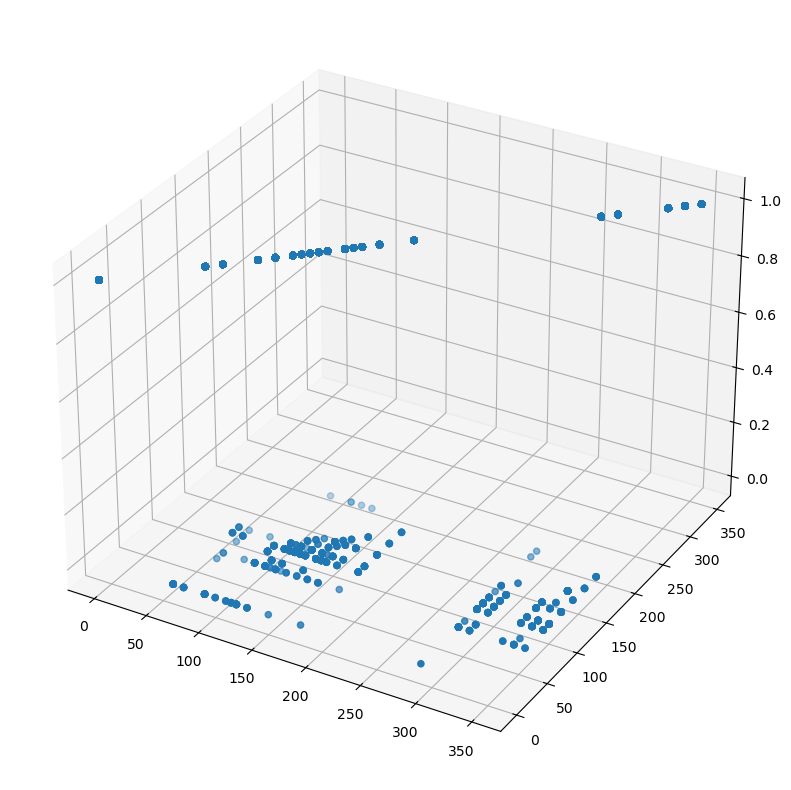

In [31]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111,projection="3d")
ax.scatter(data['Transaction_Amount'],data['Amount_paid'],y['Not Fraud'])
plt.show()

In [32]:
k_range = range(1, 10)   #considering a range of 10 clusters

# Compute the sum of squared distances (SSE) for each value of k
sse = []
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(x)
    sse.append(kmeans.inertia_)

c:\Users\firas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\firas\anaconda3\Lib\site-packages\sklearn\clust

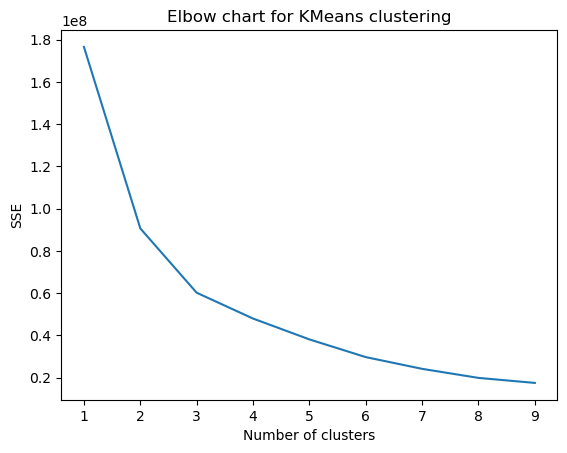

In [33]:
plt.plot(k_range, sse)
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow chart for KMeans clustering')
plt.show()

In [35]:
x['cluster'] = kmeans.labels_

In [36]:
models=[]  #initialize empty array to store models
R_squared_scores=[]
def linear_regression_on_clusters(x,y):
    
    for i in range(3):
        cluster_index= x[x['cluster'] == i].index      # getting the indexes of where cluster is i
        X = x.loc[cluster_index]       # X representing age,exp features where data  belongs to cluster of i
        Y = y.loc[cluster_index]                       # Y representing target variable 'salary' where data belongs to cluster of i
        X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=0)  #split data for train and test 
        model = LinearRegression().fit(X_train,Y_train)
        r2=r2_score_(Y_test,model.predict(X_test))      # find R_squared score
        models.append(model)
        R_squared_scores.append(r2)
        

linear_regression_on_clusters(x,y)      #x and y are independent and dependent feature we splitted initially  

In [37]:
print(R_squared_scores)

[1.0, 0.22297142197805164, 0.48321383222760605]


In [38]:
print(models)

[LinearRegression(), LinearRegression(), LinearRegression()]
